In [2]:
## Install Prerequisites ## 
!pip install matplotlib
!pip install numpy
!pip install networkx
!pip install pandas
!pip install spacy-universal-sentence-encoder
!pip install https://github.com/MartinoMensio/spacy-universal-sentence-encoder/releases/download/v0.4.3/en_use_md-0.4.3.tar.gz#en_use_md-0.4.3

  Created wheel for en-use-md: filename=en_use_md-0.4.3-py3-none-any.whl size=24377 sha256=2b6416d8f13220f621b0cb9bdf42c535c85b4cc0e87aa6cab414858ce78dded9
  Stored in directory: c:\users\harpers pc\appdata\local\pip\cache\wheels\a6\33\12\6e08cf928d0a718b31c5e775884a538731587bd1b7add290d2
Successfully built en-use-md


In [1]:
## Candidate Number: 011042
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import copy
import math
import networkx as nx

#Universal Sentence Encoder
#!pip install spacy-universal-sentence-encoder
!pip install https://github.com/MartinoMensio/spacy-universal-sentence-encoder/releases/download/v0.4.3/en_use_md-0.4.3.tar.gz#en_use_md-0.4.3
import spacy

%matplotlib inline

In [2]:
url  = "https://raw.githubusercontent.com/HarperFord/News_Articles/main/filtered.csv" #Url for the dataset
data = pd.read_csv(url, error_bad_lines=False)['title'] #Load the dataset
nlp  = spacy.load('en_use_md') #Load the Universal Sentence Encoder library

In [152]:
def scapys(a,b):
    '''
    Calculates the similarity between a and b using a Universe Sentence Encoder
    
    Keyword Arguments:
    a - (string) Text to compare
    b - (string) Text to compare
    
    Return:
    The USE similarity score between a and b
    '''
    return nlp(str(a)).similarity(nlp(str(b)))

def jaccard_similarity(a, b):
    '''
    Calcuates the Jaccard similarity between the sentences a and b
    
    Keyword Arguments:
    a - (string) Text to compare
    b - (string) Text to compare
    
    Return:
    The Jaccard similarity between a and b
    '''
    a = a.split() #Split the inputted strings into lists of words
    b = b.split()
    intersection = set(a).intersection(set(b)) #Find the intersection
    union = set(a).union(set(b)) #Find the union
    
    return len(intersection)/len(union)

In [136]:
def similarity_matrix(messages, sim_func):
    '''
    Creates an MxM matrix of similarities between all passed messages, where M is the length of messages
    
    Keyword Arguments:
    messages - (list) of string sentences to compare similarities
    sim_func - (function) what method of similarity calculation to perform
    
    Return:
    (np.array) MxM matrix f similarity scores
    '''
    a=[]
    #For each message find the similarity to all other message
    for m in range(len(messages)):
        m1 = messages[m]
        n = [sim_func(m1,messages[other]) if other != m else 1 for other in range(len(messages))]
        a += [n]
    return np.array(a)

def apply_time_fade(sim_matrix, rate):
    '''
    Applies a simple polynomial fade to the inputted sim_matrix
    
    Keyword Arguments:
    sim_matrix - (np.array) The matrix to fade
    rate       - (int) The rate of fade
    
    Return:
    (np.array) of the same size of sim_matrix with faded values
    '''
    faded = []
    #For each row in sim_matrix
    for row in range(len(sim_matrix)):
        n = sim_matrix[row]
        #Fade the row
        faded += [[n[i]-(math.sqrt((row-i)**2)/rate) for i in range(len(n))]]
    return np.array(faded)

In [138]:
def variance(similarities):
    '''
    Calculates the variance in a list of similarity scores
    
    Keyword Arguments:
    similarities - (list) of similarity scores
    
    Returns:
    (int) the variance of the similarities list
    '''
    mean = np.mean(similarities) #Find the mean
    var = sum([(ij-mean)**2 for ij in similarities])/(len(similarities)-1) #Perform a standard variance calculation
    
    return var

def find_exemplars(sim_matrix, threshold, var):
    '''
    Finds centroids from a similarity matrix and variance scores
    
    Keyword Arguments:
    sim_matrix - (np.array) MxM matrix of similarities
    threshold  - (float) How close in similarity centroids can be to one another 
    var        - (list) Of variances for each row of the sim_matrix, length M
    
    Return:
    (list) of centroids by index in the sim_matrix
    '''
    sort = sorted(range(len(var)), key=lambda i: var[i]) #Sort the variances
    exemplars = []
    
    #Move throught the variance list in desending order
    for i in reversed(sort):
        #If no centroids exist assign index as a centroid
        if len(exemplars) == 0:
            exemplars += [i]
        #Else calculate if the data-point is far enough away from generated centroids to becomea centroid
        else:
            far = True
            for t in exemplars:
                if  sim_matrix[i][t]>threshold: #If to close in similarity from centroids
                    far = False
                    break
            #Set data point as a centroid if far enough away
            if far == True:
                exemplars += [i]
            
    return exemplars

def find_nearest_exemplar(exemplars, sim_matrix, drop_threshold=0):
    '''
    Clusters data-points to their nearest centroid
    
    Keyword Arguments:
    exemplars      - (list) of centroid indexes in sim_matrix
    sim_matrix     - (np.array) similarity scores between all data-points
    drop_threshold - (float) threshold to not cluster a data-point to a centroid, if data-point is far from anyone is is not clustered at all
    
    Return:
    (list(list)) of data-point indexes. [i][j] i - index of centroid list, j - index of data-point in sim_matrix
    '''
    groups = [[] for e in exemplars] #Empty list of clusters for each centroid
    
    #For each data-point
    for r in range(len(sim_matrix)):
        #Check if data-point is a centroid
        if r not in exemplars:
            #Find closest centroid and assign data-point to their cluster
            sims = [sim_matrix[r][e] for e in exemplars]
            top = sorted(range(len(sims)), key=lambda i: sims[i])[-1]
            #If too far away from any centroid get dropped
            if sim_matrix[r][exemplars[top]] > drop_threshold:
                groups[top] += [r]
            else:
                pass
            
    return groups

In [139]:
def reduce_matrix(sub_matrix, sim_matrix):
    '''
    Returns a sub_matrix subsection of sim_matrix
    '''
    new_sim = [[sim_matrix[n][o] for o in sub_matrix] for n in sub_matrix]
    return np.array(new_sim)

In [141]:
def heatmap(values, title=""):
    '''
    Plots a heat map
    
    Keyword Arguments:
    values - (np.array) MxM matrix to plot 
    title  - (string) Filename to save heatmap fig as
    '''
    fig, ax = plt.subplots()
    im = ax.imshow(values) #Create plot and show heatmap
    fig.set_size_inches(10.5, 10.5)
    
    #If title provided save the fig
    if title != "":
        plt.savefig(title+".png", format="PNG")
        
    plt.show()
    
def network_bubble(sim_matrix, centroids, clusters, title=""):
    '''
    Generates a network graph with colored edges to represent similarity between centroids
    
    Keyword Arguments:
    sim_matrix - (np.array) MxM matrix of similarities between data-points
    centroids  - (list) Centroids as index in sim_matrix
    clusters   - (list(list)) Centroids clusters indexes in sim_matrix
    title      - (string) Filename to save the network fig as
    '''
    centroid_sizes = [len(clusters[i])*50 for i in range(len(centroids))] #Set centroid sizes based on cluster length
    centroid_sim = reduce_matrix(centroids, sim_matrix) #Select a subset of the passed sim_matrix to only include neccesary data-points
    
    G = nx.from_numpy_array(centroid_sim)
    fig, ax = plt.subplots()
    pos = nx.spring_layout(G) #Setup Graph
    
    
    edges, weights = zip(*nx.get_edge_attributes(G,'weight').items())
    
    #Draw nodes and colored edges
    nx.draw_networkx_nodes(G, node_size=centroid_sizes, pos=pos, node_color=range(len(centroids)),cmap=plt.cm.viridis)
    nx.draw_networkx_edges(G, pos, edgelist=edges, edge_color=weights, width=2, edge_cmap=plt.cm.RdYlGn, edge_vmin=0,edge_vmax=0.5)
    ax.set_facecolor('gray')
    fig.set_size_inches(20.5, 20.5)
    
    #If title provided save fig
    if title != "":
        plt.savefig(title+".png", format="PNG")
        
    plt.show()

def show_clusters(centroids, clusters, top=2):
    '''
    Displays the centroid data-point labels and their associated clusters labels
    
    Keyword Arguments:
    centroids - (list) Centroids as index of dataset
    clusters  - (list(list)) Centroids clusters indexes in dataset
    top       - (int) How many clusters to display, ordered by size
    '''
    #Sort clusters by size
    cluster_sizes = [len(i) for i in clusters]
    clusters_sorted = sorted(range(len(cluster_sizes)), key=lambda i: cluster_sizes[i]) 
    
    #Print cluster content
    for i in range(1,top+1):
        print("Exemplar:",data[centroids[clusters_sorted[-i]]])
        print("------------------")
        for j in clusters[clusters_sorted[-i]]:
            print(data[j])
        print("\n\n")

In [150]:
def kmeans(k, sim_matrix, centroids = []):
    '''
    Performs a sequential k-means clustering algorithm on the similarities matrix provided
    
    Keyword Arguments:
    k          - (int) Number of clusters to find
    sim_matrix - (np.array) MxM matrix of similarity scores between all data-points
    centroids  - (list) Assign starting centroids if wanted
    
    Returns:
    [centroids (list) indices of centroid data-points, 
    clusters (list(list)) indices of data-points in associated clusters]
    '''
    import collections
    #If starting centroids are no defined seelct them at random
    if centroids == []:
        centroids = random.sample(range(len(sim_matrix)),k)
        
    converged = False
    ittr = 0
    
    #Perform k-means until it converges or the max iterations is reached
    while ittr < 100:
        
        #Remember last centroids and refresh clusterings
        old_centroids = copy.copy(centroids)
        clusters = [[] for c in centroids]
        
        #Assign points to centroids
        for r in range(len(sim_matrix)):
            if r not in centroids:
                sims = [sim_matrix[r][c] for c in centroids]
                top = sorted(range(len(sims)), key=lambda i: sims[i])[-1]
                clusters[top] += [r]
            
        #Recalculate Centroids
        for g in range(len(clusters)):
            if len(clusters[g])>0: #If there are members in cluster recalculate centroid
                cluster_sims = [sum([sim_matrix[n][o] for o in clusters[g]]) for n in clusters[g]]
                #Find data-point that is the best exemplar of cluster
                top = sorted(range(len(cluster_sims)), key=lambda i: cluster_sims[i])[-1]
                centroids[g] = clusters[g][top]

        ittr += 1
        
    return [centroids, clusters]

In [143]:
def average_sim(sim_matrix, centroids, clusters, elim_singles=False):
    '''
    Finds the MCS and MIS from a set of centroids and clusters
    
    Keyword Arguments:
    sim_matrix   - (np.array) similarities matrix 
    centroids    - (list) Indexes of centroids in sim_matrix
    clusters     - (list(list)) Indexes of cluster members in sim_matrix
    elim_singles - (boolean) If True clusters of length <1 are ignored for calculations
    '''
    
    #Reduce matrix down to centroids
    centroid_matrix = reduce_matrix(centroids, sim_matrix)
    #Add centroids to their clusters
    clusters = [clusters[i]+[centroids[i]] for i in range(len(centroids))]
    
    #Remove <1 length clusters if needed
    if elim_singles == True:
        removing = []
        for c in clusters:
            if len(c) > 1:
                removing += [c]
        clusters = removing
    
    #Reduce matrix down to clusters
    cluster_matrices = [reduce_matrix(c, sim_matrix) for c in clusters]
    
    #Find the average similarity score between centroids
    centroid_avg = centroid_matrix.mean()
    
    #Find the average similarity scores between clustered data-points
    cluster_avg  = [c.mean() for c in cluster_matrices]
    
    print("Outer Cluster Similarity Average: %f" % centroid_avg)
    print("Inner Cluster Similarity Average: %f" % np.mean(cluster_avg))

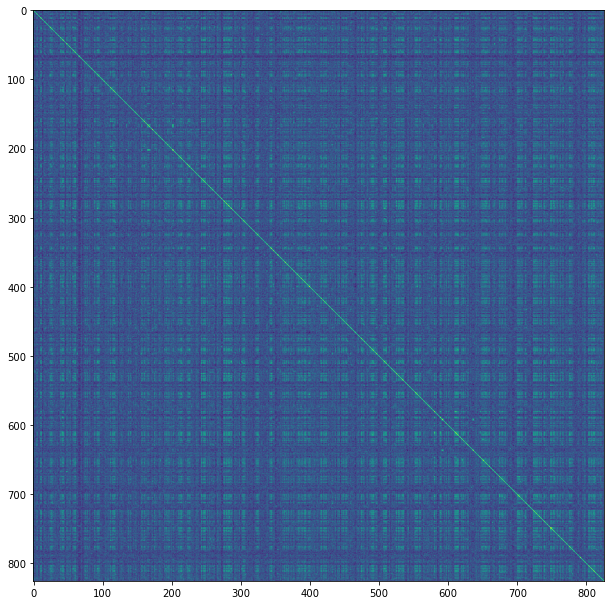

In [42]:
sim = similarity_matrix(list(data[:826]), scapys) #Create the similarity matrix of data using a Universal Sentence Encoder
heatmap(sim) # Display similartiy matrix heatmap

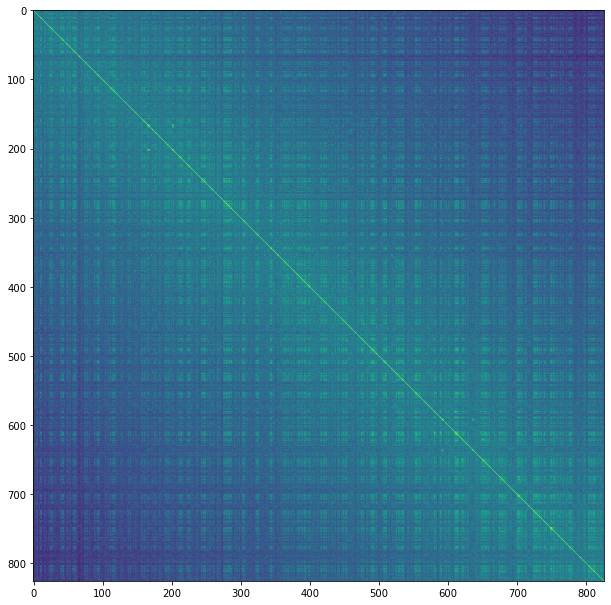

In [87]:
faded_sim = apply_time_fade(sim, 2000) #Apply time-scaling to the similarity matrix
heatmap(faded_sim) #Show heatmap of similarity matrix with time-scaling

The largest topic found was 'donald trump is sworn in as president capping his swift ascent ' with 16 headings in their cluster.


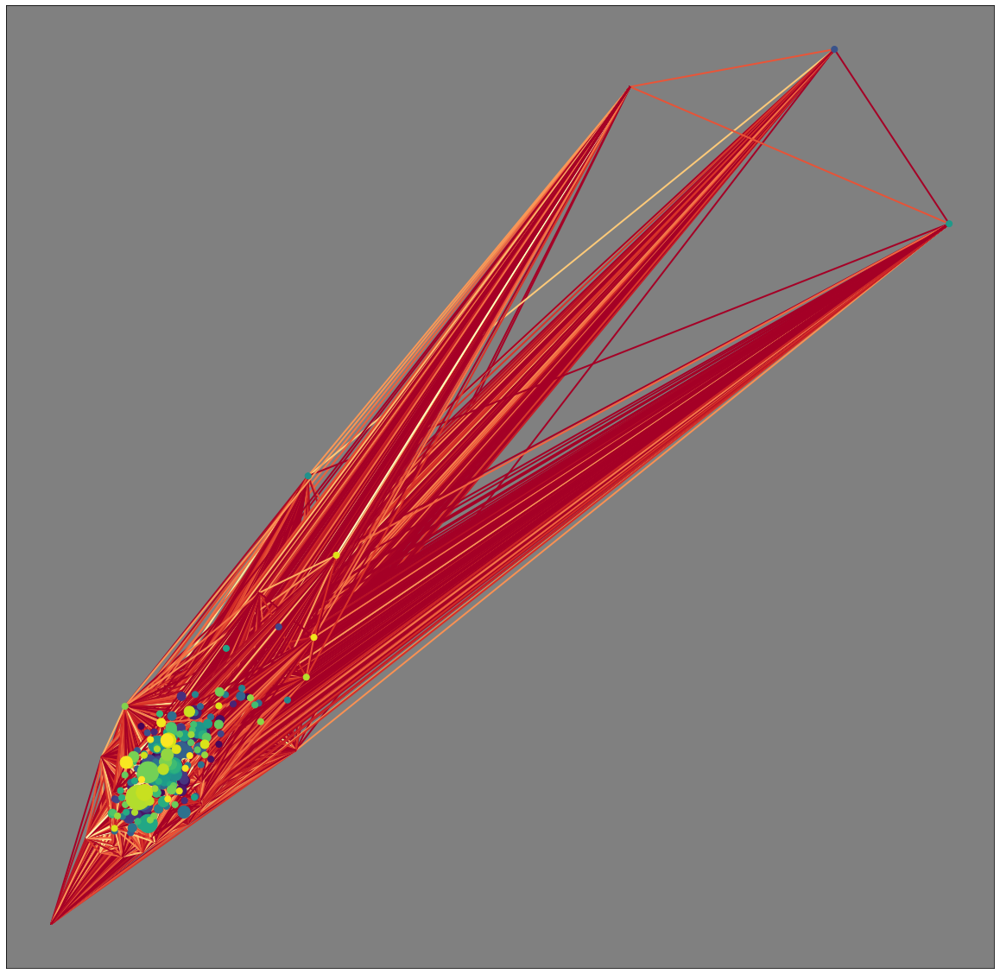

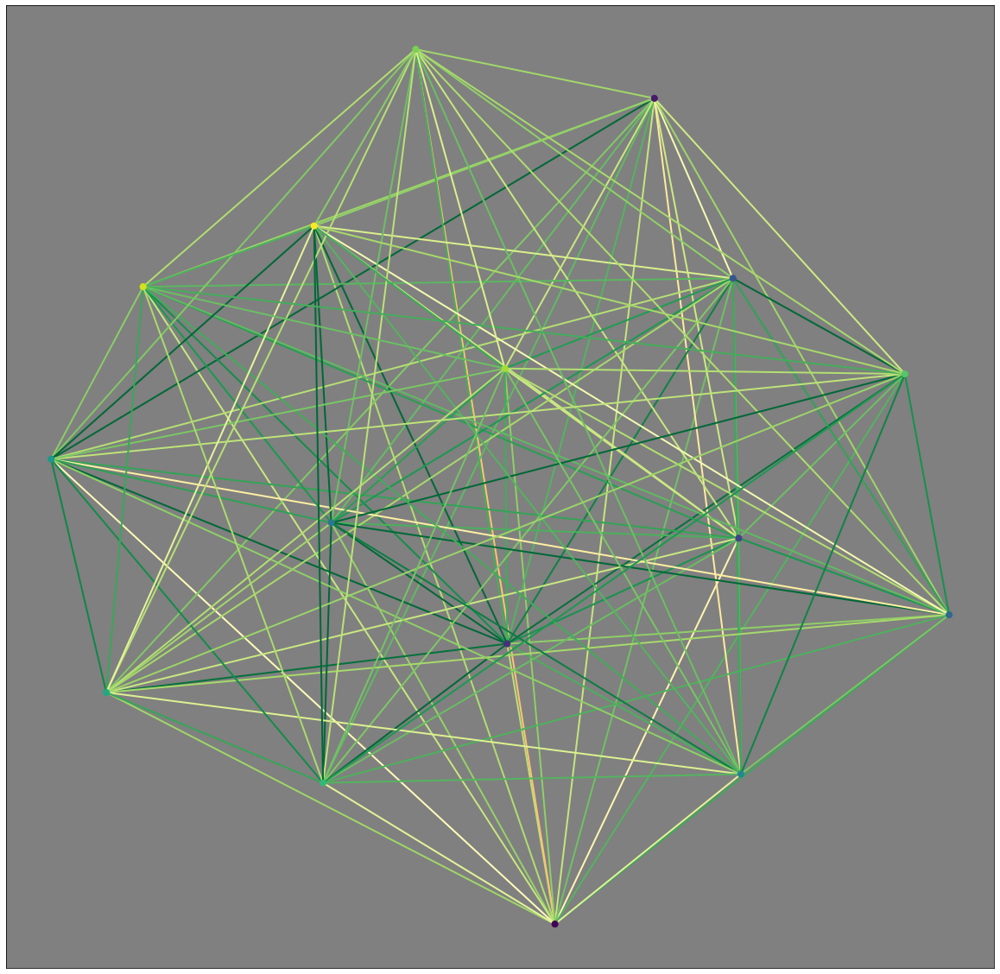

Outer Cluster Similarity Average: 0.085081
Inner Cluster Similarity Average: 0.917345


In [151]:
## K-MEANS WITH NON-FADED SIMILARITIES ##

out = kmeans(379, sim) #Perform K-Means

#Sort by cluster sizes
cluster_sizes = [len(i) for i in out[1]]
clusters_sorted = sorted(range(len(cluster_sizes)), key=lambda i: cluster_sizes[i])

print("The largest topic found was '%s' with %i headings in their cluster." % (data[out[0][clusters_sorted[-1]]],len(out[1][clusters_sorted[-1]])))


#Plot network of similarities of all centroids
network_bubble(sim, out[0], out[1])

#Plot network of similarities of top clusters (by size)
network_bubble(sim, out[1][clusters_sorted[-1]], [[1] for i in range(len(out[1][clusters_sorted[-1]]))],"Kmeans_Top_Cluster.png")

#Calculate statistics
average_sim(sim, out[0],out[1])

In [145]:
#Show the data-points that have been clustered together - top 4 largest clusters
show_clusters(out[0], out[1], 4)

Exemplar: as inauguration nears trump keeps world leaders on edge 
------------------
in break with precedent obama envoys are denied extensions past inauguration day 
as inauguration nears trump keeps world leaders on edge 
trump entering white house unbent and unpopular 
the two bibles donald trump used at the inauguration 
road trip to trumps inauguration lets see what he can do 
with echoes of the s trump resurrects a hardline vision of america first 
trump inspires cheers and alarm around the world 
trumps improvised path to a month of executive action 
trump abandons transpacific partnership obamas signature trade deal 
trump follows obamas lead in flexing executive muscle 
elon musk has trumps ear and wall street takes note 
trump backers like his first draft of a new america 
trump called national park chief over twitter post on inaugural crowd 
donald trumps longtime doctor says president takes hairgrowth drug 



Exemplar: gop campaign to repeal obamacare stalls on the detail

Found 379 topics from 826 articles.
The largest topic found was 'trump russia and the news story that wasnt ' with 43 headings in their cluster.


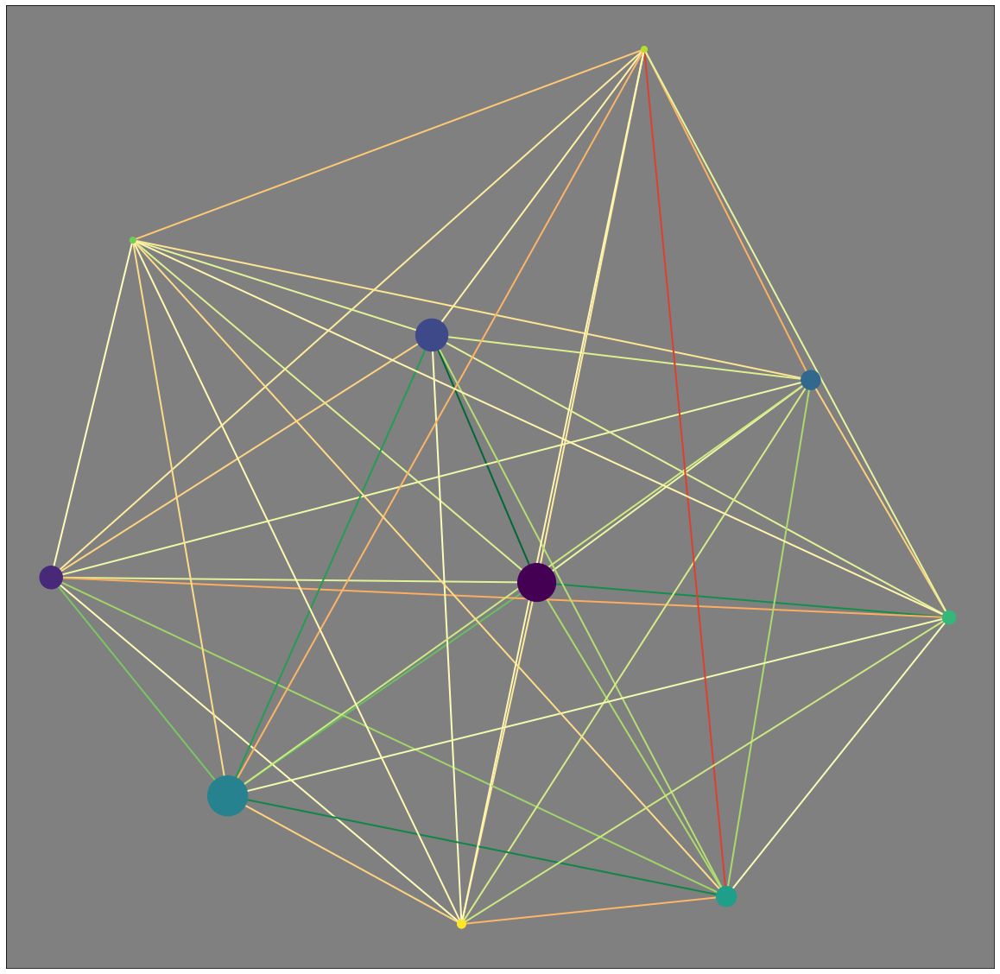

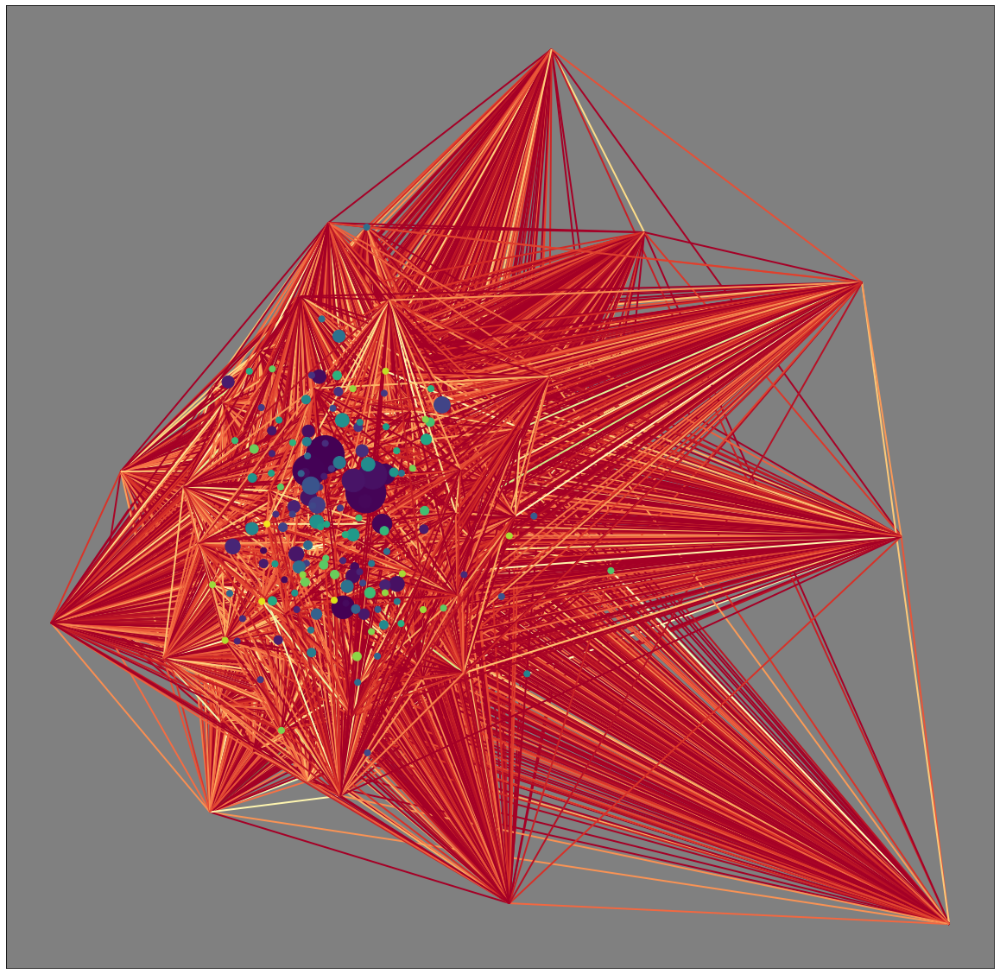

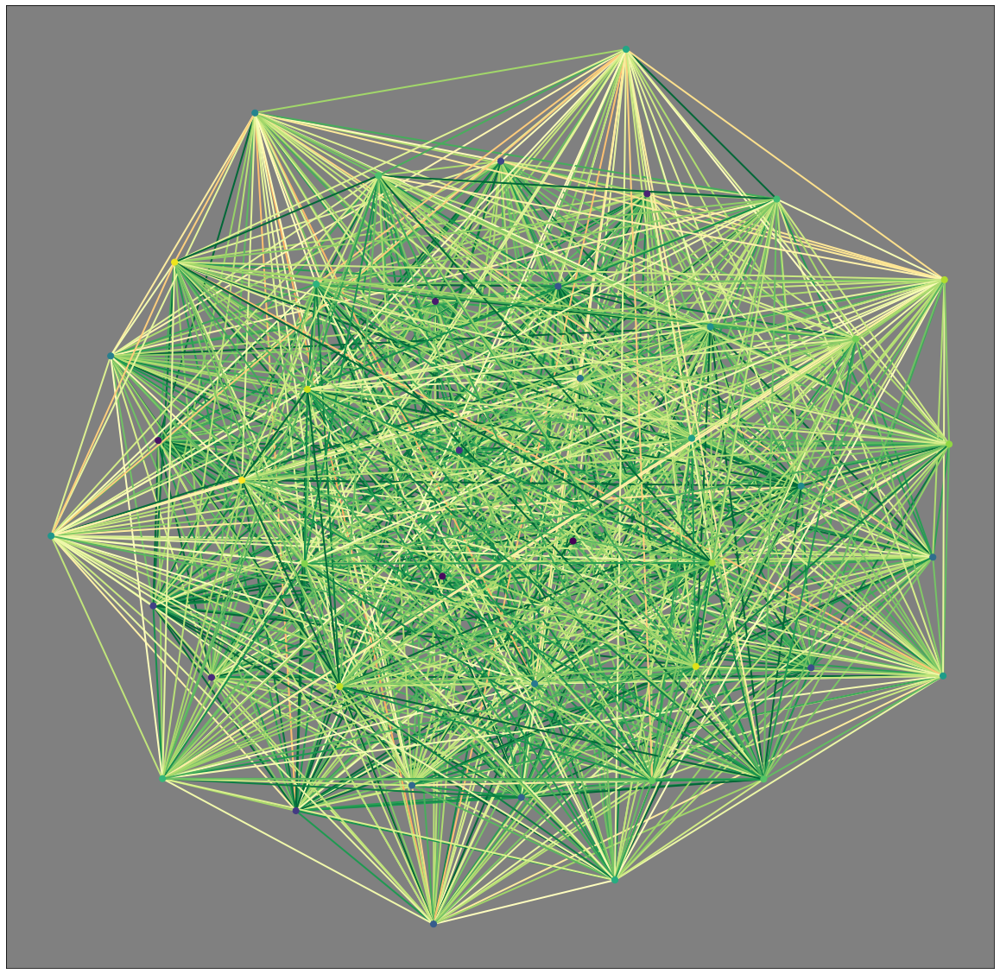

Outer Cluster Similarity Average: 0.071862
Inner Cluster Similarity Average: 0.862272


In [147]:
## EXEMPLAR CLUSTERING WITH FADED SIMILARITIES ##

variances = [variance(row) for row in faded_sim] #Calculate variances
exemplars = find_exemplars(faded_sim, 0.3, variances) #Find centroids

g = find_nearest_exemplar(exemplars, faded_sim) #Assign data-points to nearest centroids

#Find largest cluster
cluster_sizes = [len(i) for i in g]
clusters_sorted = sorted(range(len(cluster_sizes)), key=lambda i: cluster_sizes[i])[-1]

print("Found %i topics from %i articles." % (len(exemplars), len(sim)))
print("The largest topic found was '%s' with %i headings in their cluster." % (data[exemplars[clusters_sorted]],len(g[clusters_sorted])))


#Plot network of similarities of top 10 clusters
network_bubble(sim, exemplars[:10],g[:10])

#Plot similarities between all clusters
network_bubble(sim, exemplars,g)

#Plot inner similarities of larget cluster
network_bubble(sim, g[clusters_sorted], [[1] for i in range(len(g[clusters_sorted]))])

#Find statistics of clustering
average_sim(sim, exemplars, g)


Found 233 topics from 826 articles.
The largest topic found was 'donald trump concedes russias interference in election ' with 136 headings in their cluster.


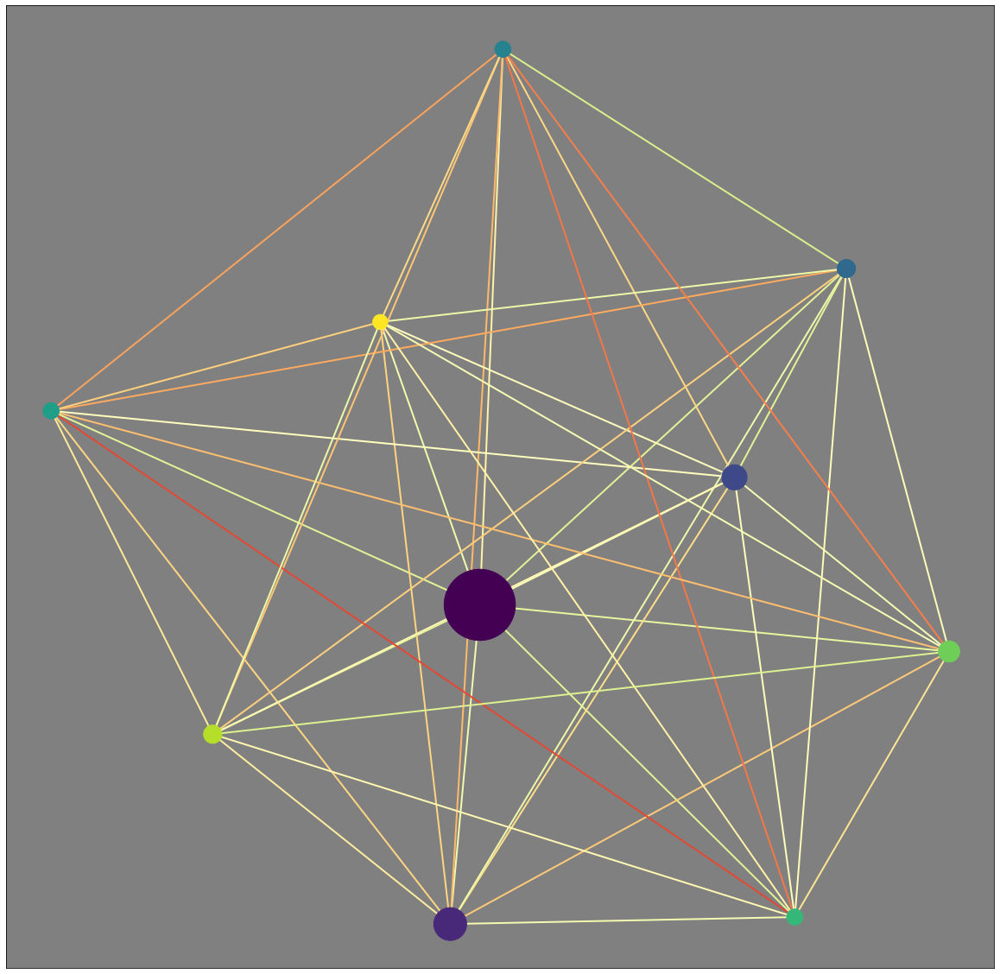

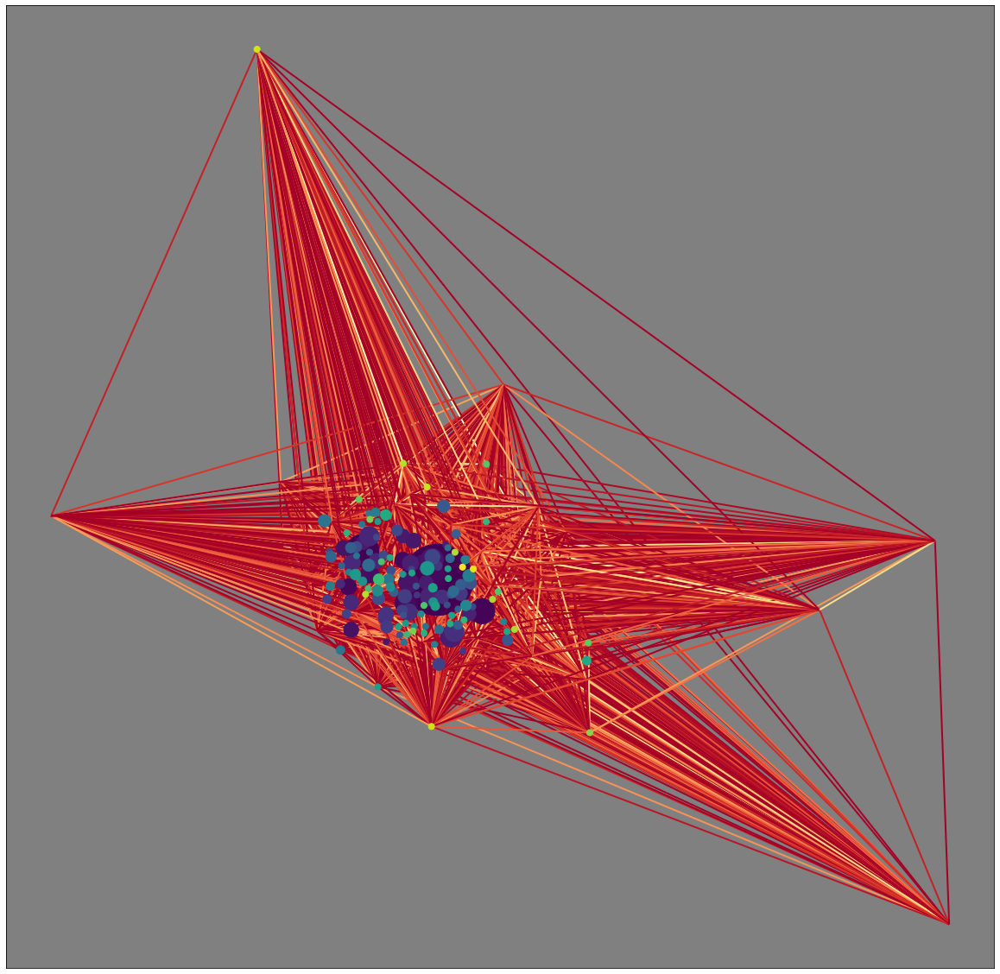

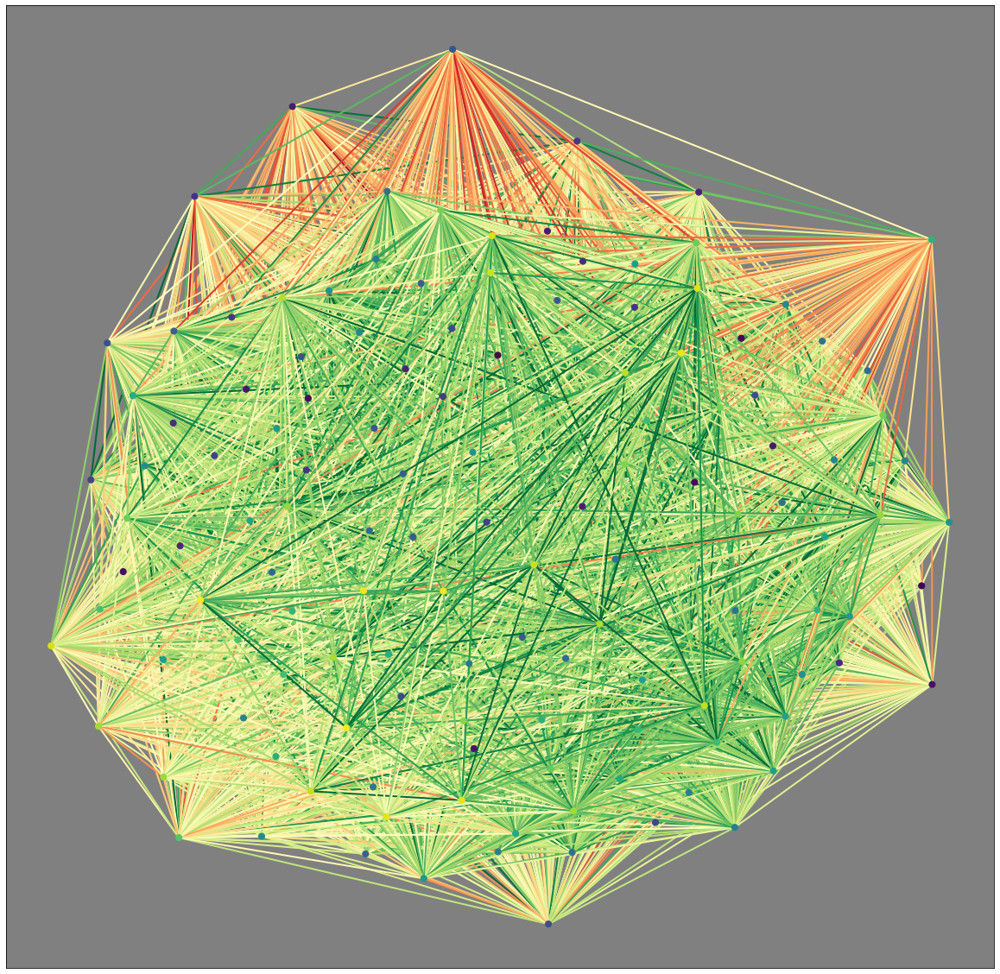

Outer Cluster Similarity Average: 0.062965
Inner Cluster Similarity Average: 0.738184


In [148]:
## EXEMPLAR CLUSTERING WITH NON-FADED SIMILARITIES ##

variances = [variance(row) for row in sim] #Calculate variances
exemplars = find_exemplars(sim, 0.3, variances) #Find centroids

g = find_nearest_exemplar(exemplars, sim) #Assign data-points to nearest centroids

#Find largest cluster
cluster_sizes = [len(i) for i in g]
clusters_sorted = sorted(range(len(cluster_sizes)), key=lambda i: cluster_sizes[i])[-1]

print("Found %i topics from %i articles." % (len(exemplars), len(sim)))
print("The largest topic found was '%s' with %i headings in their cluster." % (data[exemplars[clusters_sorted]],len(g[clusters_sorted])))


#Plot network of similarities of top 10 clusters
network_bubble(sim, exemplars[:10],g[:10])

#Plot similarities between all clusters
network_bubble(sim, exemplars,g)

#Plot inner similarities of larget cluster
network_bubble(sim, g[clusters_sorted], [[1] for i in range(len(g[clusters_sorted]))])

#Find statistics of clustering
average_sim(sim, exemplars, g)

In [149]:
#Show the data-points that have been clustered together - top 2 largest clusters
show_clusters(exemplars, g)

Exemplar: donald trump concedes russias interference in election 
------------------
weak federal powers could limit trumps climatepolicy rollback 
can carbon capture technology prosper under trump 
maralago the future winter white house and home of the calmer trump 
istanbul donald trump benjamin netanyahu  
trump appears to side with assange over intelligence agencies conclusions 
california hires eric holder as legal bulwark against donald trump 
how elites became one of the nastiest epithets in american politics 
ivanka trumps new washington home once belonged to a putin foe 
donald trump nominates wall street lawyer to head sec 
fed officials see faster economic growth under trump but no boom 
countering trump bipartisan voices strongly affirm findings on russian hacking 
the perfect weapon how russian cyberpower invaded the us 
putin led a complex cyberattack scheme to aid trump report finds 
russian intervention in american election was no oneoff 
trump nominees filings threaten